# XY Bending Modes from FEA

In [1]:
import numpy as np
import pandas as pd
import scipy.io
import os

import sys
sys.path.insert(0, '../')
from M1S_tools import *

import matplotlib.pyplot as plt

plt.jet()

%matplotlib inline

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
## bending modes & influence matrices etc from Buddy #####################
ML actuators =  165 165
Afn =  (6991, 165)
fv =  (165, 165)
U matrix (6991, 165)
N node =  6991
## bending modes & influence matrices etc from Trupti #####################
N actuators =  170
/Users/bxin/Library/CloudStorage/OneDrive-SharedLibraries-GMTOCorp/M1S Portal - Documents/influnce_matrix_files/OA_influence_matrices_all/OA_surface_normal_165SA_09Jan2025/
Afz =  (27547, 165)
U matrix (27547, 165)
S matrix (165, 165)

<Figure size 640x480 with 0 Axes>

2/26/25: Afx, Afy handled by M1S_tools.py. See output above. 

UxMat VxMat etc are not, because they are not needed by most notebooks

165    5
166    5
167    5
168    5
169    5
Name: LSActType, dtype: int64
85


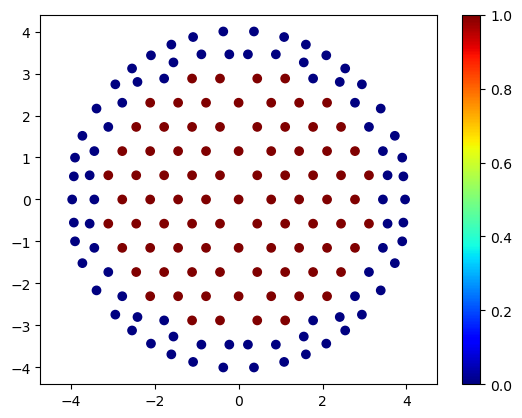

In [11]:
idx_triple = saz<0.03
print(dfSA['LSActType'][-5:]) #5 means quads; last 5 are quads, so we can simply remove them.
idx_triple = idx_triple[:-5]

plt.scatter(sax[:-5], say[:-5], c=idx_triple)
plt.axis('equal')
plt.colorbar();
print(sum(idx_triple))

In [124]:
dataFolder = '/Users/bxin/Library/CloudStorage/OneDrive-SharedLibraries-GMTOCorp/M1S Portal - Documents' +\
    '/influnce_matrix_files/OA_influence_matrices_all/OA_surface_normal_165SA_XYBM_%s/'%TRDate

#read Fx Bending Modes & forces
df = pd.read_csv(dataFolder+'Ux_norm-nohp-%s-%s-%s.csv'%(TRDate[:2],TRDate[2:5],TRDate[5:]), header=None)
UxMat = np.array(df)
print('Ux matrix', UxMat.shape)
df = pd.read_csv(dataFolder+'Vx_norm-nohp-%s-%s-%s.csv'%(TRDate[:2],TRDate[2:5],TRDate[5:]), header=None)
VxMat = np.array(df)
print('Vx matrix', VxMat.shape)
df = pd.read_csv(dataFolder+'Sx_norm-nohp-%s-%s-%s.csv'%(TRDate[:2],TRDate[2:5],TRDate[5:]), header=None)
SxMat = np.array(df)
print('Sx matrix', SxMat.shape)

#read Fy Bending Modes & forces
df = pd.read_csv(dataFolder+'Uy_norm-nohp-%s-%s-%s.csv'%(TRDate[:2],TRDate[2:5],TRDate[5:]), header=None)
UyMat = np.array(df)
print('Uy matrix', UyMat.shape)
df = pd.read_csv(dataFolder+'Vy_norm-nohp-%s-%s-%s.csv'%(TRDate[:2],TRDate[2:5],TRDate[5:]), header=None)
VyMat = np.array(df)
print('Vy matrix', VyMat.shape)
df = pd.read_csv(dataFolder+'Sy_norm-nohp-%s-%s-%s.csv'%(TRDate[:2],TRDate[2:5],TRDate[5:]), header=None)
SyMat = np.array(df)
print('Sy matrix', SyMat.shape)

############normalize bending modes to RMS = 1um ###################
#UMat is already normalized by TR to RMS of 1.
Vx_no_zero = VxMat[idx_triple,:]
VxMat = np.linalg.pinv(SxMat@Vx_no_zero.T/Vx_no_zero.shape[0])*1e-6 #this match force RMS given by TR, 2/27/25.
Vy_no_zero = VyMat[idx_triple,:]
VyMat = np.linalg.pinv(SyMat@Vx_no_zero.T/Vy_no_zero.shape[0])*1e-6

print(VxMat.shape)
for modeID in range(1, 11):
    print('%02d '%modeID, ' %4.0f'%(np.std(VxMat[:,modeID-1])), ' %4.0f'%(np.std(VyMat[:,modeID-1])*.5))
#yes, 1um RMS BM1 takes 300N to make, compared to Axial BM1 of 5N. So, ~50 times stiffer

Ux matrix (27547, 85)
Vx matrix (165, 85)
Sx matrix (85, 85)
Uy matrix (27547, 85)
Vy matrix (165, 85)
Sy matrix (85, 85)
(85, 85)
01    152   150
02    155   151
03    258   275
04    281   277
05    323   293
06    346   359
07    824   809
08    838   853
09   1009   939
10   1103  1015


In [114]:
Vh.shape

(85, 85)

In [73]:
print('Afx = ', Afx.shape)
print('Afy = ', Afy.shape)

Afx =  (27547, 85)
Afy =  (27547, 85)


In [74]:
Afx_triple = Afx #[:, idx_triple] 2/5/25 Afx is already trimmed to 85 columns by Trupti
Afy_triple = Afy #

### check the index does give me triple SAs only.

#### check I can reproduce the all-SA x bending modes from Trupti. Yes.

In [75]:
#full matrix svd take ~2 minutes
U, S, Vh = np.linalg.svd(Afx, full_matrices=False)
V = np.transpose(Vh)
for modeID in range(1, U.shape[1]+1):
    V[:, modeID-1] *= 1e-6/S[modeID-1]*np.sqrt(U.shape[0])
    print(modeID, np.std(VxMat[modeID-1]))

0.7177405625652732


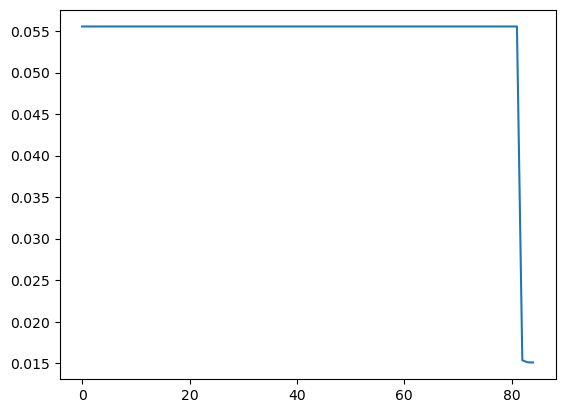

In [77]:
#plt.plot(S);
plt.plot(np.diag(SxMat)/S)
print(np.std(VxMat[:,0]))

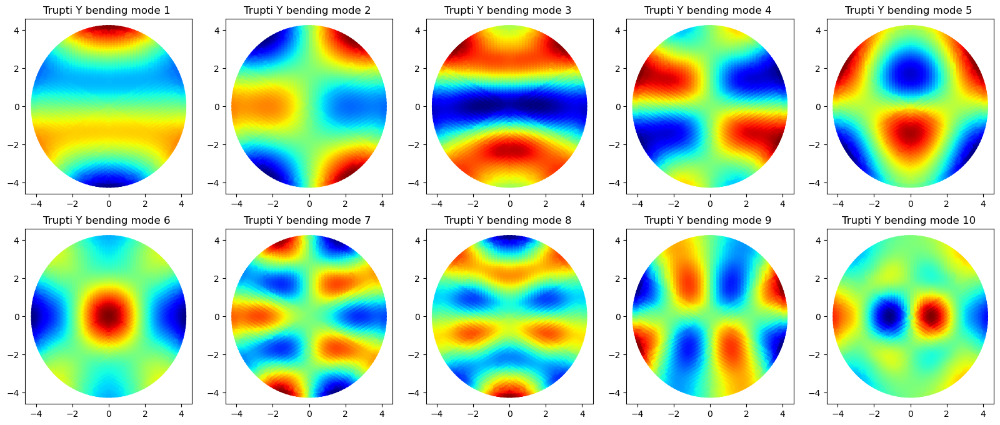

In [30]:
nrow = 2
fig, ax = plt.subplots(nrow,5,figsize=(20,4*nrow))
i = 0
for modeID in range(1,5*nrow+1):
    irow = np.int8(i/5)
    icol = np.mod(i,5)
    i += 1

    img = ax[irow][icol].scatter(nodex, nodey,10, UyMat[:,modeID-1])
    ax[irow][icol].set_title('Trupti Y bending mode %d '%modeID)

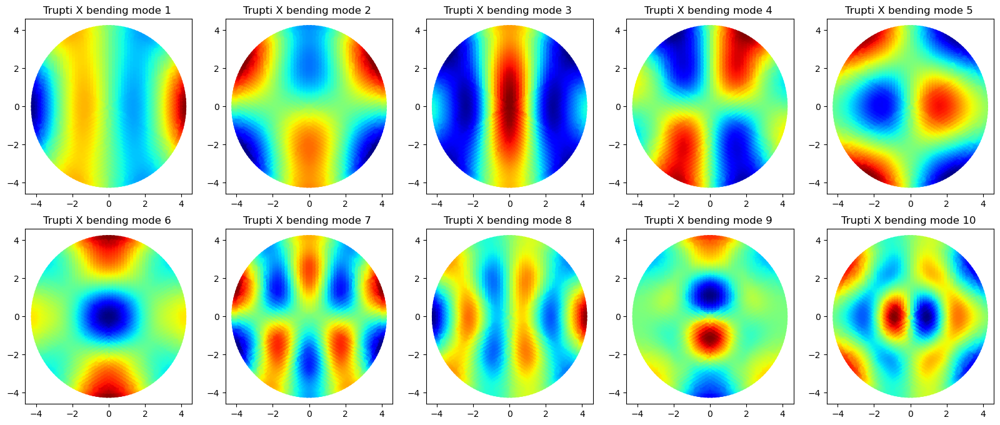

In [31]:
nrow = 2
fig, ax = plt.subplots(nrow,5,figsize=(20,4*nrow))
i = 0
for modeID in range(1,5*nrow+1):
    irow = np.int8(i/5)
    icol = np.mod(i,5)
    i += 1

    img = ax[irow][icol].scatter(nodex, nodey,10, UxMat[:,modeID-1])
    ax[irow][icol].set_title('Trupti X bending mode %d '%modeID)

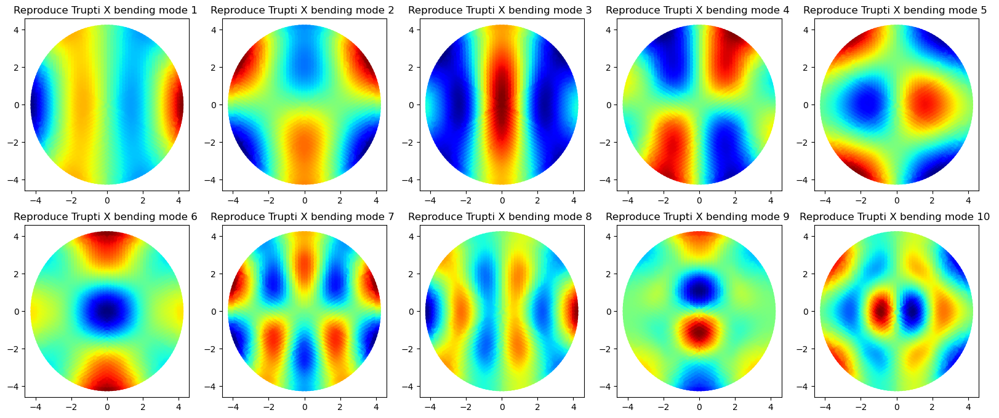

In [14]:
nrow = 2
fig, ax = plt.subplots(nrow,5,figsize=(20,4*nrow))
i = 0
for modeID in range(1,5*nrow+1):
    irow = np.int8(i/5)
    icol = np.mod(i,5)
    i += 1

    img = ax[irow][icol].scatter(nodex, nodey,10, U[:,modeID-1])
    ax[irow][icol].set_title('Reproduce Trupti X bending mode %d '%modeID)

In [15]:
#checking whether PTT was subtracted
np.std(Afx, axis=1), np.mean(Afx, axis=1)

(array([6.64327453e-11, 6.66294313e-11, 6.71859054e-11, ...,
        5.84173720e-11, 6.14568237e-11, 6.19011690e-11]),
 array([-2.33914149e-26,  1.42140485e-26, -9.68387086e-27, ...,
         9.57948136e-27,  2.88904993e-27,  1.60418299e-26]))

## SVD of influence matrix with Triple Actuators only

In [50]:
if 0: #this was for the time when Trupti did Afx SVD on all 170 actuators and I had to do my own 90-SA SVD
    filename = 'dataFiles/XYBendingModes_GMT.npy'
    if not os.path.exists(filename):
        #each SVD takes ~2 minutes
        Ux90, Sx90, Vhx90 = np.linalg.svd(Afx_triple)
        Vx90 = np.transpose(Vhx90)
        print(Vx90.shape)
        Uy90, Sy90, Vhy90 = np.linalg.svd(Afy_triple)
        Vy90 = np.transpose(Vhy90)
        print(Vy90.shape)
        Ux90 = Ux90[:,:len(Sx90)]
        Uy90 = Uy90[:,:len(Sy90)]
        with open(filename, 'wb') as f:
            np.save(f, Ux90)
            np.save(f, Sx90)
            np.save(f, Vx90)
            np.save(f, Uy90)
            np.save(f, Sy90)
            np.save(f, Vy90)
    else:
        with open(filename, 'rb') as f:
            Ux90 = np.load(f)
            Sx90 = np.load(f)
            Vx90 = np.load(f)
            Uy90 = np.load(f)
            Sy90 = np.load(f)
            Vy90 = np.load(f)
    ############normalize bending modes to RMS = 1um ###################
    Ux90 *= np.sqrt(Ux90.shape[0])
    for modeID in range(1, Ux90.shape[1]+1):
        Vx90[:, modeID-1] *= 1e-6/Sx90[modeID-1]*np.sqrt(Ux90.shape[0]) #1e-6 due to meter to micron conversion
    Uy90 *= np.sqrt(Uy90.shape[0])
    for modeID in range(1, Uy90.shape[1]+1):
        Vy90[:, modeID-1] *= 1e-6/Sy90[modeID-1]*np.sqrt(Uy90.shape[0]) #1e-6 due to meter to micron conversion
else: #after 2/25/25, we just use Trupti's modes. 

    #we use the old name to avoid breaking code. it is actually 85
    Ux90 = UxMat
    Sx90 = SxMat
    Vx90 = VxMat
    Uy90 = UyMat
    Sy90 = SyMat
    Vy90 = VyMat

In [17]:
print(UxMat.shape, Ux90.shape, Uy90.shape)
print(VxMat.shape, Vx90.shape, Vy90.shape)

(27547, 85) (27547, 85) (27547, 85)
(165, 85) (165, 85) (165, 85)


In [18]:
Afx_triple.shape

(27547, 85)

In [19]:
sax[:-5][idx_triple].shape

(85,)

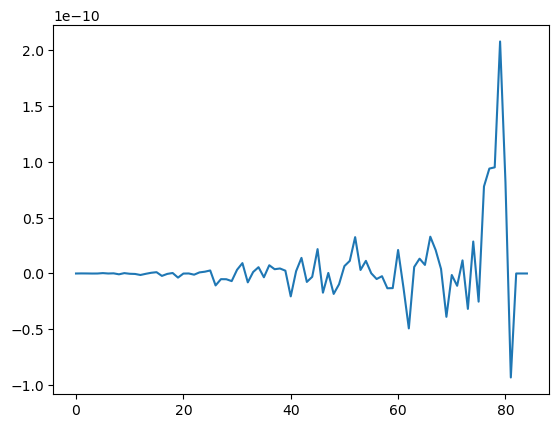

In [21]:
#average force for each V vector
plt.plot(np.mean(Vx90, axis=0))

(-3.417788, 3.417788, -3.1720639, 3.1705779)

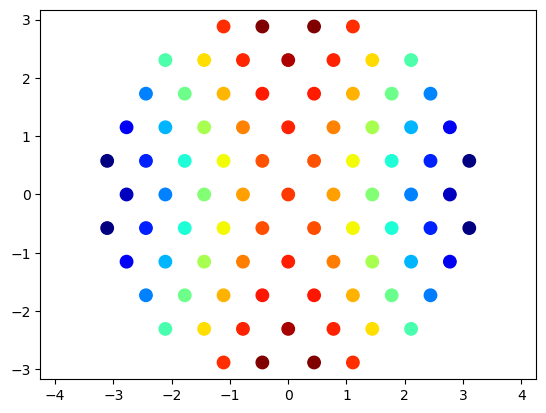

In [22]:
#V is only availabe if we have run the part above on reproducing Trupti's all-SA bending modes.
plt.scatter(sax[:-5][idx_triple], say[:-5][idx_triple], 80, V[:,0])
plt.axis('equal')

In [23]:
Vx90[:,0].shape

(165,)

(-4.364811, 4.364811, -4.406176, 4.404714)

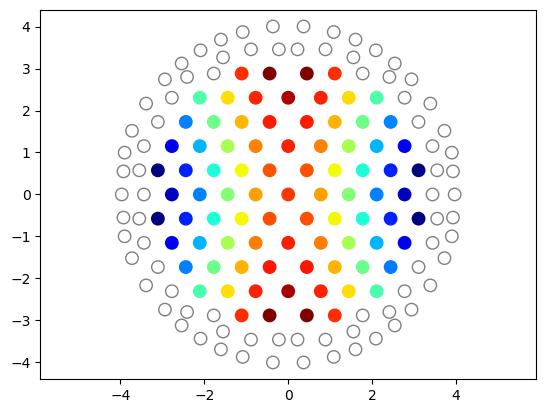

In [24]:
plt.scatter(sax[:-5][idx_triple], say[:-5][idx_triple], 80, Vx90[idx_triple,0])
plt.scatter(sax[:-5][~idx_triple], say[:-5][~idx_triple], 80, edgecolors='grey', facecolors='none')
plt.axis('equal')

### 4/3/24 Trupti provided her XY bending modes for Triple axis SAs only

Let's plot those and compare to mine

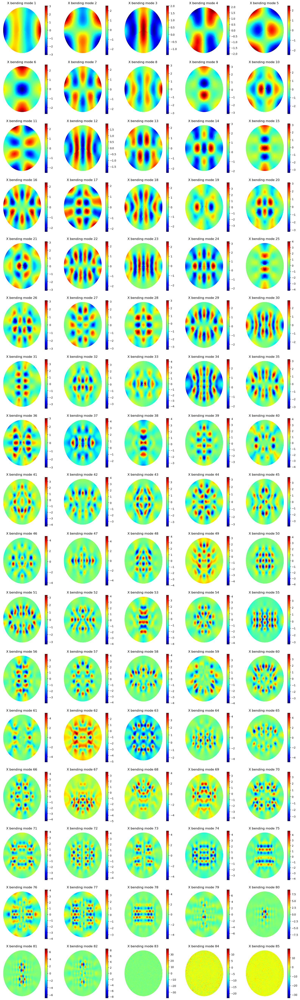

In [52]:
#we don't have 90 modes, because the forces applied to the two ends of the quads are always equal, so 90-5=85
# However, the x bending modes should have Fx and Rz contrained, so we should have 85-2 = 83 non-zero modes.
# but plots below show that we have 82. why??
nrow = 17
fig, ax = plt.subplots(nrow,5,figsize=(20,4*nrow))
i = 0
for modeID in range(1,5*nrow+1):
    irow = np.int8(i/5)
    icol = np.mod(i,5)
    i += 1

    img = ax[irow][icol].scatter(nodex, nodey,10, Ux90[:,modeID-1])
    ax[irow][icol].set_title('X bending mode %d '%modeID)
    ax[irow][icol].axis('off')
    fig.colorbar(img, ax=ax[irow][icol]);

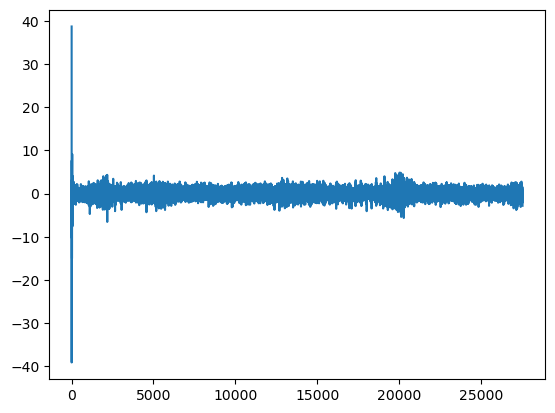

In [58]:
plt.plot(Ux90[:,83-1])

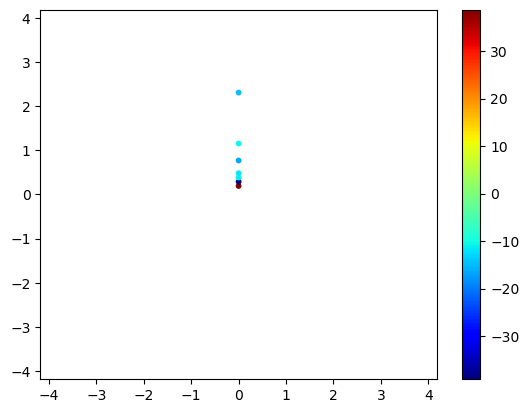

In [64]:
aa = Ux90[:,83-1].copy()
aa[np.abs(aa)<10] = np.nan
plt.scatter(nodex, nodey,10, aa)
plt.xlim(-radius_of_CA, radius_of_CA)
plt.ylim(-radius_of_CA, radius_of_CA)
plt.colorbar();

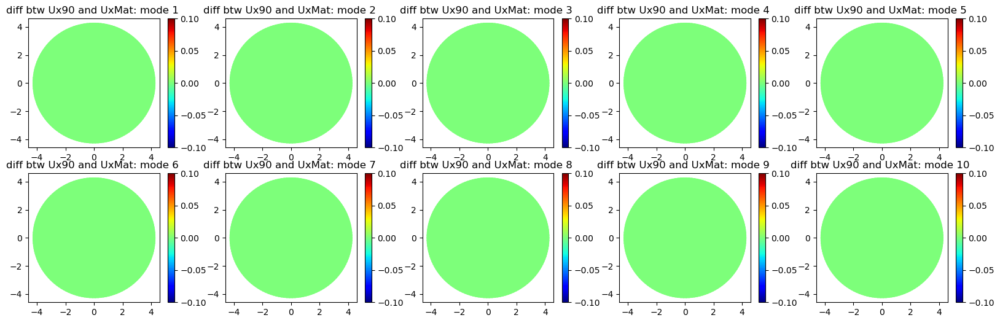

In [27]:
nrow = 2
fig, ax = plt.subplots(nrow,5,figsize=(20,3*nrow))
i = 0
for modeID in range(1,5*nrow+1):
    irow = np.int8(i/5)
    icol = np.mod(i,5)
    i += 1

    img = ax[irow][icol].scatter(nodex, nodey,10, Ux90[:,modeID-1]-UxMat[:,modeID-1])
    ax[irow][icol].set_title("diff btw Ux90 and UxMat: mode %d "%modeID)
    fig.colorbar(img, ax=ax[irow][icol]);
#2/25/25: we've assigned them to be identical above.

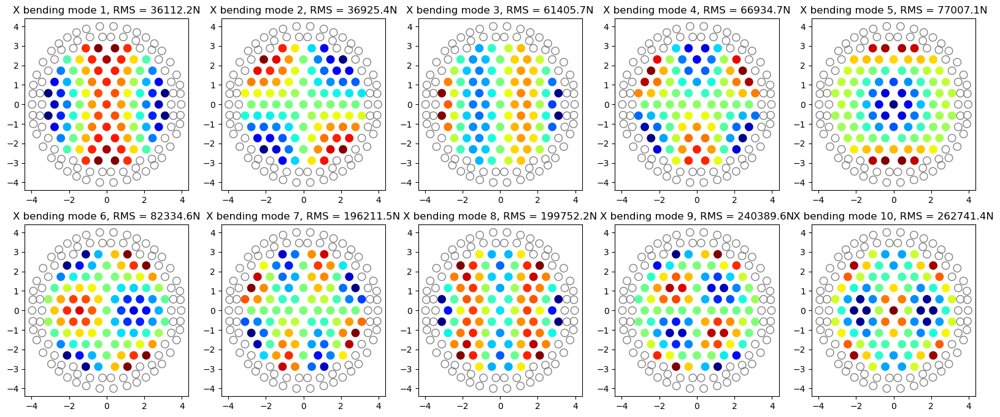

In [51]:
nrow = 2
fig, ax = plt.subplots(nrow,5,figsize=(20,4*nrow))
i = 0
for modeID in range(1,5*nrow+1):
    irow = np.int8(i/5)
    icol = np.mod(i,5)
    i += 1

    img = ax[irow][icol].scatter(sax[:-5][idx_triple], say[:-5][idx_triple],80, Vx90[idx_triple,modeID-1])
    ax[irow][icol].set_title('X bending mode %d, RMS = %.1fN'%(modeID, np.std(Vx90[:,modeID-1])))
    ax[irow][icol].scatter(sax[:-5][~idx_triple], say[:-5][~idx_triple], 80, edgecolors='grey', facecolors='none')

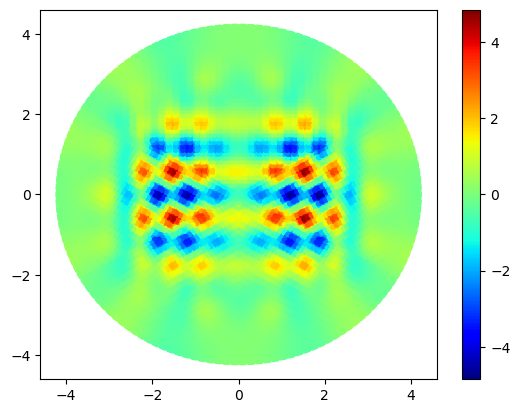

In [37]:
plt.scatter(nodex, nodey,10, Ux90[:,-8])
plt.colorbar();

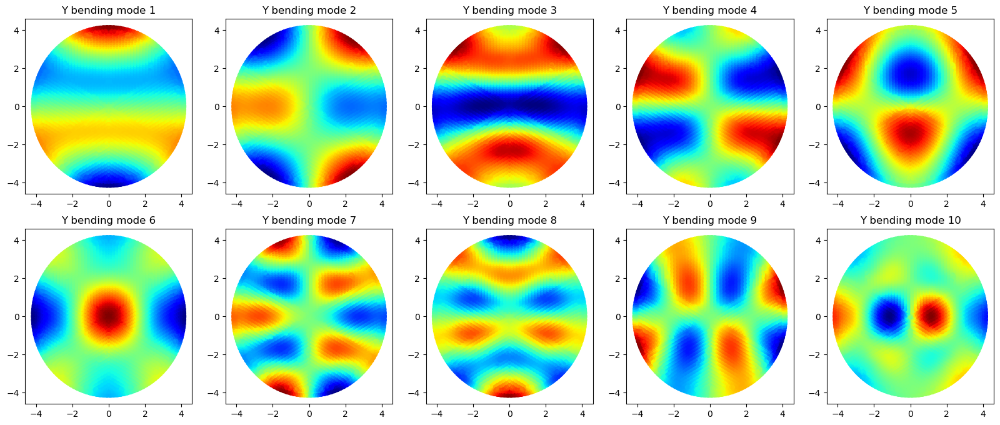

In [38]:
nrow = 2
fig, ax = plt.subplots(nrow,5,figsize=(20,4*nrow))
i = 0
for modeID in range(1,5*nrow+1):
    irow = np.int8(i/5)
    icol = np.mod(i,5)
    i += 1

    img = ax[irow][icol].scatter(nodex, nodey,10, Uy90[:,modeID-1])
    ax[irow][icol].set_title('Y bending mode %d'%modeID)

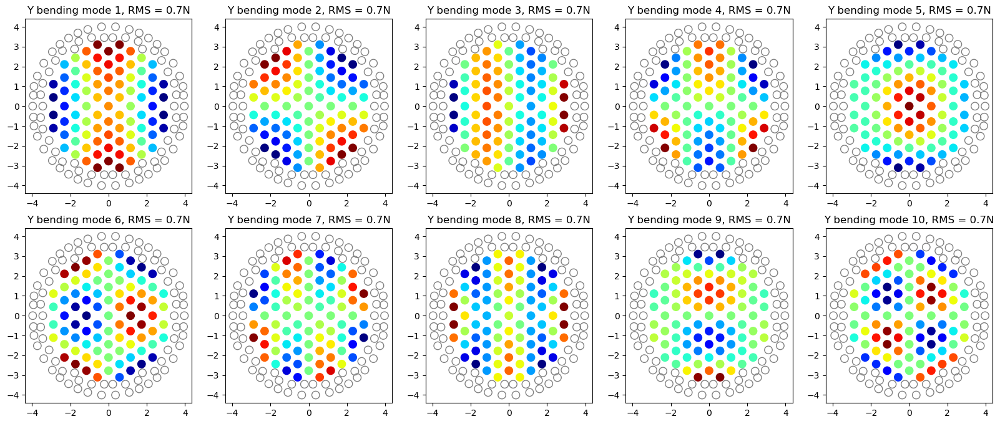

In [40]:
nrow = 2
fig, ax = plt.subplots(nrow,5,figsize=(20,4*nrow))
i = 0
for modeID in range(1,5*nrow+1):
    irow = np.int8(i/5)
    icol = np.mod(i,5)
    i += 1

    img = ax[irow][icol].scatter(say[:-5][idx_triple], sax[:-5][idx_triple],80, Vy90[idx_triple,modeID-1])
    ax[irow][icol].set_title('Y bending mode %d, RMS = %.1fN'%(modeID, np.std(Vy90[:,modeID-1])))
    ax[irow][icol].scatter(sax[:-5][~idx_triple], say[:-5][~idx_triple], 80, edgecolors='grey', facecolors='none')

## Let's calculate the surface slopes of the bending modes

X modes first

In [41]:
#BM surf nodes (as in the GMT FEA) are not on a regular grid.
# this gives a approximate sense of grid size
np.sqrt(nodex.shape[0])

165.97288935244816

In [42]:
pixSize = 50e-3 #50mm, so that 166 pixels cover 8.3m
vec = np.arange(np.min(nodex), np.max(nodex)+pixSize, pixSize)
xfit, yfit = np.meshgrid(vec, vec)
print(xfit.shape)
rfit = np.sqrt(xfit**2+yfit**2)
mask = np.ones_like(rfit)
mask[rfit>np.max(xfit)]=np.nan

(169, 169)


In [43]:
from scipy.interpolate import griddata

done


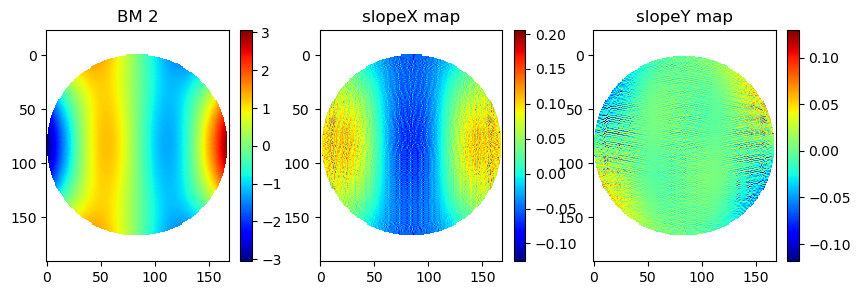

In [28]:
slopeMax = np.zeros(Ux90.shape[1])
slopeRms = np.zeros(Ux90.shape[1])
fig, ax = plt.subplots(1,3, figsize=(10,3))
for i in np.arange(10):
    #print(i, end = ' ')
    dd = griddata(np.vstack((nodex, nodey)).T, Ux90[:,i], (xfit, yfit), method='nearest')
    slopeX = dd*mask - np.roll(dd*mask,1,axis=1)
    slopeY = dd*mask - np.roll(dd*mask,1,axis=0)
    slope = np.sqrt(slopeX**2+slopeY**2)*2 # we want um per 100mm (each pixel is 50mm)

    slopeMax[i] = np.max(slope[~np.isnan(slope)]) #slope is the sqrt of X and Y so it is already positive
    slopeRms[i] = np.sqrt(np.mean((slope[~np.isnan(slope)]**2)))
    #print(slopeMax[i], slopeRms[i], np.std(slope[~np.isnan(slope)]))
    if i==2:
        img = ax[0].imshow(dd*mask)
        ax[0].axis('equal')
        ax[0].set_title('BM %d'%i)
        fig.colorbar(img, ax=ax[0]);

        img = ax[1].imshow(slopeX)
        ax[1].axis('equal')
        ax[1].set_title('slopeX map')
        fig.colorbar(img, ax=ax[1]);
        
        img = ax[2].imshow(slopeY)
        ax[2].axis('equal')
        ax[2].set_title('slopeY map')
        fig.colorbar(img, ax=ax[2]);
print('done')

In [27]:
def f90to170(fin):
    fout = np.zeros(nact)
    fout[idx_triple] = fin
    return fout

In [29]:
c = np.ones_like(slopeMax)
print('modeID,  S RMS(nm),  S MAX(nm), F/puck RMS(N), F/puck MAX(N), slope RMS (nm/100mm), slope MAX (nm/100mm)')
for i in np.arange(10):
    gmtF = f90to170(Vx90[:,i])
    if i<5:
        c[i] = 0.5 #make 500nm surf RMS
    else:
        c[i] = 80./np.std(gmtF/npuck) #scale force down to 100N

    #overwrite c[i] above
    c[i] = np.min([147./np.max(abs(gmtF/npuck)), 0.5])
    print('%3d, %10.0f, %12.0f,    %8.0f,    %8.0f,           %8.0f,           %8.0f'%(i+1, #c[i],
                                                   c[i]*1000*np.std(Ux90[:,i]), c[i]*1000*np.max(abs(Ux90[:,i])),
                                                    c[i]*np.std(gmtF/npuck), c[i]*np.max(abs(gmtF/npuck)), 
                                                    c[i]*1000*slopeRms[i], c[i]*1000*slopeMax[i]
                                                   ))

modeID,  S RMS(nm),  S MAX(nm), F/puck RMS(N), F/puck MAX(N), slope RMS (nm/100mm), slope MAX (nm/100mm)
  1,        500,         1343,           8,          17,                 47,                137
  2,        500,         1280,          37,         105,                 63,                174
  3,        500,         1529,          38,         102,                 67,                221
  4,        374,          797,          54,         147,                 44,                129
  5,        306,          739,          51,         147,                 43,                111
  6,        319,          914,          54,         147,                 38,                149
  7,        250,          763,          48,         147,                 43,                135
  8,        128,          327,          52,         147,                 25,                 72
  9,        113,          356,          49,         147,                 23,                 67
 10,        110,          349, 

### Do the same for Y modes

done


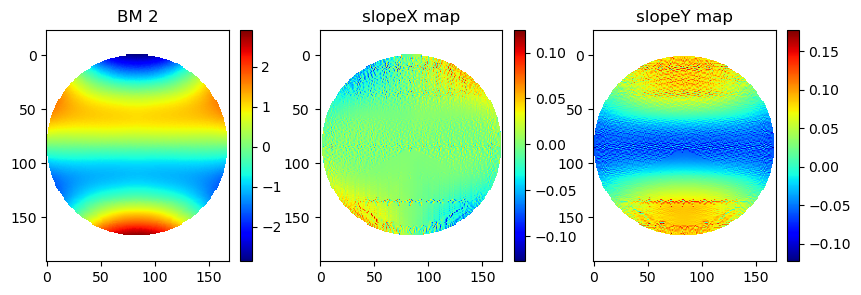

In [30]:
slopeMax = np.zeros(Uy90.shape[1])
slopeRms = np.zeros(Uy90.shape[1])
fig, ax = plt.subplots(1,3, figsize=(10,3))
for i in np.arange(10):
    #print(i, end = ' ')
    dd = griddata(np.vstack((nodex, nodey)).T, Uy90[:,i], (xfit, yfit), method='nearest')
    slopeX = dd*mask - np.roll(dd*mask,1,axis=1)
    slopeY = dd*mask - np.roll(dd*mask,1,axis=0)
    slope = np.sqrt(slopeX**2+slopeY**2)*2 # we want um per 100mm (each pixel is 50mm)

    slopeMax[i] = np.max(slope[~np.isnan(slope)])
    slopeRms[i] = np.sqrt(np.mean((slope[~np.isnan(slope)]**2)))
    #print(slopeMax[i], slopeRms[i], np.std(slope[~np.isnan(slope)]))
    if i==2:
        img = ax[0].imshow(dd*mask)
        ax[0].axis('equal')
        ax[0].set_title('BM %d'%i)
        fig.colorbar(img, ax=ax[0]);

        img = ax[1].imshow(slopeX)
        ax[1].axis('equal')
        ax[1].set_title('slopeX map')
        fig.colorbar(img, ax=ax[1]);
        
        img = ax[2].imshow(slopeY)
        ax[2].axis('equal')
        ax[2].set_title('slopeY map')
        fig.colorbar(img, ax=ax[2]);
print('done')

In [31]:
c = np.ones_like(slopeMax)
print('modeID,  S RMS(nm),  S MAX(nm), F/puck RMS(N), F/puck MAX(N), slope RMS (nm/100mm), slope MAX (nm/100mm)')
for i in np.arange(10):
    gmtF = f90to170(Vy90[:,i])
    if i<5:
        c[i] = 0.5 #make 500nm surf RMS
    else:
        c[i] = 80./np.std(gmtF/npuck) #scale force down to 100N

    #overwrite c[i] above
    c[i] = np.min([147./np.max(abs(gmtF/npuck)), 0.5])
    print('%3d, %10.0f, %12.0f,    %8.0f,    %8.0f,           %8.0f,           %8.0f'%(i+1, #c[i],
                                                   c[i]*1000*np.std(Uy90[:,i]), c[i]*1000*np.max(abs(Uy90[:,i])),
                                                    c[i]*np.std(gmtF/npuck), c[i]*np.max(abs(gmtF/npuck)), 
                                                    c[i]*1000*slopeRms[i], c[i]*1000*slopeMax[i]
                                                   ))

modeID,  S RMS(nm),  S MAX(nm), F/puck RMS(N), F/puck MAX(N), slope RMS (nm/100mm), slope MAX (nm/100mm)
  1,        500,         1332,           8,          18,                 46,                144
  2,        500,         1302,          36,          96,                 62,                176
  3,        500,         1453,          37,          98,                 62,                203
  4,        397,          784,          53,         147,                 47,                153
  5,        347,          768,          53,         147,                 49,                146
  6,        289,          792,          54,         147,                 36,                109
  7,        258,          623,          56,         147,                 42,                141
  8,        134,          403,          52,         147,                 24,                 88
  9,        125,          331,          50,         147,                 24,                 75
 10,        115,          325, 